# Assignment - 10: Clustering on Donors Choose dataset

This exercise is to apply Clustering on Donors Choose dataset and predict approval of a new project proposal.

Relevant Information : The dataset is divided into two files -
1. train.csv file which contains information regarding projects, schools and teachers who submitted the projects. 
2. resources.csv which provides information about the resources required for each project.




### OBJECTIVE : The goal is to make clusters of data points and group them based on the common properties of those data points and finally make clusters using 3 different algorithms - K-Means Clustering, Agglomerative Clustering, DBSCAN Clustering.



In [1]:
# Importing the required libraries
# Warning reference : https://stackoverflow.com/questions/41658568/chunkize-warning-while-installing-gensim

%matplotlib inline
import warnings
warnings.filterwarnings(action='ignore', category = UserWarning , module = 'gensim')

import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from nltk.stem.porter import PorterStemmer

import re
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

## 1. Reading the data

In [2]:
project_data = pd.read_csv('train_data.csv')
resource_data = pd.read_csv('resources.csv')

print("\nNumber of data points in train data", project_data.shape)
print('-'*120)
print("The attributes of data :", project_data.columns.values)



Number of data points in train data (109248, 17)
------------------------------------------------------------------------------------------------------------------------
The attributes of data : ['Unnamed: 0' 'id' 'teacher_id' 'teacher_prefix' 'school_state'
 'project_submitted_datetime' 'project_grade_category'
 'project_subject_categories' 'project_subject_subcategories'
 'project_title' 'project_essay_1' 'project_essay_2' 'project_essay_3'
 'project_essay_4' 'project_resource_summary'
 'teacher_number_of_previously_posted_projects' 'project_is_approved']


In [3]:
project_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 109248 entries, 0 to 109247
Data columns (total 17 columns):
Unnamed: 0                                      109248 non-null int64
id                                              109248 non-null object
teacher_id                                      109248 non-null object
teacher_prefix                                  109245 non-null object
school_state                                    109248 non-null object
project_submitted_datetime                      109248 non-null object
project_grade_category                          109248 non-null object
project_subject_categories                      109248 non-null object
project_subject_subcategories                   109248 non-null object
project_title                                   109248 non-null object
project_essay_1                                 109248 non-null object
project_essay_2                                 109248 non-null object
project_essay_3                       

## NOTE:
1. We have a total of 109248 datapoints and 17 columns.
2. Now we have to sort the data according to date and time so as to have a better prediction on the future data (Test data).
3. As we can see there are null points for project_essay_3 and project_essay_4. Only 3758 points are not null.
4. In teacher_prefix there are 109245 points which means 3 points are null.

### `Sorting according to date`

In [4]:
# how to replace elements in list python: https://stackoverflow.com/a/2582163/4084039
cols = ['Date' if x=='project_submitted_datetime' else x for x in list(project_data.columns)]


#sort dataframe based on time pandas python: https://stackoverflow.com/a/49702492/4084039
project_data['Date'] = pd.to_datetime(project_data['project_submitted_datetime'])
project_data.drop('project_submitted_datetime', axis=1, inplace=True)
project_data.sort_values(by=['Date'], inplace=True)


# how to reorder columns pandas python: https://stackoverflow.com/a/13148611/4084039
project_data = project_data[cols]

print(cols)

['Unnamed: 0', 'id', 'teacher_id', 'teacher_prefix', 'school_state', 'Date', 'project_grade_category', 'project_subject_categories', 'project_subject_subcategories', 'project_title', 'project_essay_1', 'project_essay_2', 'project_essay_3', 'project_essay_4', 'project_resource_summary', 'teacher_number_of_previously_posted_projects', 'project_is_approved']


In [5]:
# Dropping the Unnamed column

project_data.drop('Unnamed: 0', axis=1, inplace=True)

### `Adding the price and quantity column from resource_data to the project_data`

In [6]:
# https://stackoverflow.com/questions/22407798/how-to-reset-a-dataframes-indexes-for-all-groups-in-one-step
price_data = resource_data.groupby('id').agg({'price':'sum', 'quantity':'sum'}).reset_index()

# join two dataframes in python: 
project_data = pd.merge(project_data, price_data, on='id', how='left')

# Deleting the resource data variable
del resource_data

### Now we have to separate the approved and the not approved data points

In [7]:
# Creating the approved and rejected data frames
project_approved = project_data[project_data['project_is_approved'] == 1]
project_reject = project_data[project_data['project_is_approved'] == 0]

print('Number of projects that got approval : ', project_approved.shape)
print("Numer of projects that didn't get approval : ", project_reject.shape)

Number of projects that got approval :  (92706, 18)
Numer of projects that didn't get approval :  (16542, 18)


## NOTE:
1. We have a imbalanced approved (+ve) and not approved (-ve) points.
2. We have to sample our data as number of approved (+ve) points are more than not approved (-ve) points.

In [8]:
# Sampling 16542 points for not approved (-ve) and 60000 points for approved (+ve) points
# Reference: https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.sample.html
# Reference: https://pandas.pydata.org/pandas-docs/stable/user_guide/merging.html

project_approved = project_approved[project_approved['project_is_approved'] == 1].sample(n = 10000, random_state=1)
project_reject = project_reject[project_reject['project_is_approved'] == 0].sample(n = 10000, random_state=1)

# Concatinating the two data frames
# Reference: https://stackoverflow.com/questions/51835369/combine-two-dataframes-one-row-from-each-one-at-a-time-python-

project_data = pd.concat([project_approved, project_reject]).sort_index(kind='merge')

In [9]:
project_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20000 entries, 1 to 109233
Data columns (total 18 columns):
id                                              20000 non-null object
teacher_id                                      20000 non-null object
teacher_prefix                                  20000 non-null object
school_state                                    20000 non-null object
Date                                            20000 non-null datetime64[ns]
project_grade_category                          20000 non-null object
project_subject_categories                      20000 non-null object
project_subject_subcategories                   20000 non-null object
project_title                                   20000 non-null object
project_essay_1                                 20000 non-null object
project_essay_2                                 20000 non-null object
project_essay_3                                 676 non-null object
project_essay_4                             

## NOTE:
1. As we can see that the price and the quantity column has been added to the project_data
2. This is where the preprocessing will start.
3. we are going to consider

       - school_state : categorical data
       - clean_categories : categorical data
       - clean_subcategories : categorical data
       - project_grade_category : categorical data
       - teacher_prefix : categorical data
       
       - project_title : text data
       - essay : text data
       
       - quantity : numerical
       - teacher_number_of_previously_posted_projects : numerical
       - price : numerical

## 2. Preprocessing Data

### `project_subject_categories`

In [10]:
catogories = list(project_data['project_subject_categories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python
cat_list = []
for i in catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp+=j.strip()+" " #" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_') # we are replacing the & value into 
    cat_list.append(temp.strip())
    
project_data['clean_categories'] = cat_list
project_data.drop(['project_subject_categories'], axis=1, inplace=True)

from collections import Counter
my_counter = Counter()
for word in project_data['clean_categories'].values:
    my_counter.update(word.split())

cat_dict = dict(my_counter)
sorted_cat_dict = dict(sorted(cat_dict.items(), key=lambda kv: kv[1]))

### `project_subject_subcategories`

In [11]:
sub_catogories = list(project_data['project_subject_subcategories'].values)
# remove special characters from list of strings python: https://stackoverflow.com/a/47301924/4084039

# https://www.geeksforgeeks.org/removing-stop-words-nltk-python/
# https://stackoverflow.com/questions/23669024/how-to-strip-a-specific-word-from-a-string
# https://stackoverflow.com/questions/8270092/remove-all-whitespace-in-a-string-in-python

sub_cat_list = []
for i in sub_catogories:
    temp = ""
    # consider we have text like this "Math & Science, Warmth, Care & Hunger"
    for j in i.split(','): # it will split it in three parts ["Math & Science", "Warmth", "Care & Hunger"]
        if 'The' in j.split(): # this will split each of the catogory based on space "Math & Science"=> "Math","&", "Science"
            j=j.replace('The','') # if we have the words "The" we are going to replace it with ''(i.e removing 'The')
        j = j.replace(' ','') # we are placeing all the ' '(space) with ''(empty) ex:"Math & Science"=>"Math&Science"
        temp +=j.strip()+" "#" abc ".strip() will return "abc", remove the trailing spaces
        temp = temp.replace('&','_')
    sub_cat_list.append(temp.strip())

project_data['clean_subcategories'] = sub_cat_list
project_data.drop(['project_subject_subcategories'], axis=1, inplace=True)

# count of all the words in corpus python: https://stackoverflow.com/a/22898595/4084039
my_counter = Counter()
for word in project_data['clean_subcategories'].values:
    my_counter.update(word.split())
    
sub_cat_dict = dict(my_counter)
sorted_sub_cat_dict = dict(sorted(sub_cat_dict.items(), key=lambda kv: kv[1]))

## Text Preprocessing

## `Essay`

In [12]:
# Combining all the essay
# merge two column text dataframe: 

project_data["essay"] = project_data["project_essay_1"].map(str) +\
                        project_data["project_essay_2"].map(str) + \
                        project_data["project_essay_3"].map(str) + \
                        project_data["project_essay_4"].map(str)

In [13]:
project_data['essay'].describe()

count                                                 20000
unique                                                19993
top       We are a title I school located in the Pee Dee...
freq                                                      2
Name: essay, dtype: object

In [14]:
# Making the decontracted function

# https://stackoverflow.com/a/47091490/4084039
import re

def decontracted(phrase):
    # specific
    phrase = re.sub(r"won't", "will not", phrase)
    phrase = re.sub(r"can\'t", "can not", phrase)

    # general
    phrase = re.sub(r"n\'t", " not", phrase)
    phrase = re.sub(r"\'re", " are", phrase)
    phrase = re.sub(r"\'s", " is", phrase)
    phrase = re.sub(r"\'d", " would", phrase)
    phrase = re.sub(r"\'ll", " will", phrase)
    phrase = re.sub(r"\'t", " not", phrase)
    phrase = re.sub(r"\'ve", " have", phrase)
    phrase = re.sub(r"\'m", " am", phrase)
    return phrase


### STOPWORDS
# https://gist.github.com/sebleier/554280
# we are removing the words from the stop words list: 'no', 'nor', 'not'
stopwords= ['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've",\
            "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', \
            'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their',\
            'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', \
            'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', \
            'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', \
            'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after',\
            'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further',\
            'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more',\
            'most', 'other', 'some', 'such', 'only', 'own', 'same', 'so', 'than', 'too', 'very', \
            's', 't', 'can', 'will', 'just', 'don', "don't", 'should', "should've", 'now', 'd', 'll', 'm', 'o', 're', \
            've', 'y', 'ain', 'aren', "aren't", 'couldn', "couldn't", 'didn', "didn't", 'doesn', "doesn't", 'hadn',\
            "hadn't", 'hasn', "hasn't", 'haven', "haven't", 'isn', "isn't", 'ma', 'mightn', "mightn't", 'mustn',\
            "mustn't", 'needn', "needn't", 'shan', "shan't", 'shouldn', "shouldn't", 'wasn', "wasn't", 'weren', "weren't", \
            'won', "won't", 'wouldn', "wouldn't"]


# Combining all the above statements 
from tqdm import tqdm
preprocessed_essays = []
# tqdm is for printing the status bar
for sentance in tqdm(project_data['essay'].values):
    sent = decontracted(sentance)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e.lower() not in stopwords)
    preprocessed_essays.append(sent.lower().strip())

100%|██████████| 20000/20000 [00:12<00:00, 1557.23it/s]


<h2><font color='red'>project_title</font></h2>

In [15]:
project_data['project_title'].describe()

count                20000
unique               19353
top       Flexible Seating
freq                    46
Name: project_title, dtype: object

In [16]:
# Project_title

# Combining all the above statements 
from tqdm import tqdm
preprocessed_titles = []
# tqdm is for printing the status bar
for sentence in tqdm(project_data['project_title'].values):
    sent = decontracted(sentence)
    sent = sent.replace('\\r', ' ')
    sent = sent.replace('\\"', ' ')
    sent = sent.replace('\\n', ' ')
    sent = re.sub('[^A-Za-z0-9]+', ' ', sent)
    # https://gist.github.com/sebleier/554280
    sent = ' '.join(e for e in sent.split() if e not in stopwords)
    preprocessed_titles.append(sent.lower().strip())

100%|██████████| 20000/20000 [00:00<00:00, 31589.39it/s]


### Replacing the columns with new cleaned columns - Project_title and Essay

In [17]:
# Adding processed essay columns in place of previous essays columns and dropping the previous columns

## ESSAY

project_data['clean_essays'] = preprocessed_essays
project_data.drop(['project_essay_1'], axis=1, inplace=True)
project_data.drop(['project_essay_2'], axis=1, inplace=True)
project_data.drop(['project_essay_3'], axis=1, inplace=True)
project_data.drop(['project_essay_4'], axis=1, inplace=True)
project_data.drop(['essay'], axis=1, inplace=True)

In [18]:
## Project_title

# Adding processed project_title columns in place of previous project_title column and dropping the previous column

project_data['clean_titles'] = preprocessed_titles

project_data.drop(['project_title'], axis=1, inplace=True)


### Dropping the nan rows present in teacher_prefix

In [19]:
# Dropping NAN row
# https://stackoverflow.com/questions/46091924/python-how-to-drop-a-row-whose-particular-column-is-empty-nan

project_data.dropna(axis = 0, inplace = True, subset = ['teacher_prefix'])

In [20]:
project_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20000 entries, 1 to 109233
Data columns (total 15 columns):
id                                              20000 non-null object
teacher_id                                      20000 non-null object
teacher_prefix                                  20000 non-null object
school_state                                    20000 non-null object
Date                                            20000 non-null datetime64[ns]
project_grade_category                          20000 non-null object
project_resource_summary                        20000 non-null object
teacher_number_of_previously_posted_projects    20000 non-null int64
project_is_approved                             20000 non-null int64
price                                           20000 non-null float64
quantity                                        20000 non-null int64
clean_categories                                20000 non-null object
clean_subcategories                         

<h1><font color='red'>************************************ASSIGNMENT************************************</font></h1>

<h2>3. Splitting data into Train and Test: Stratified Sampling</h2>

In [21]:
# Creating label and feature data frame : Label- y, Features- X

y = project_data['project_is_approved'].values
project_data.drop(['project_is_approved'], axis=1, inplace=True)
X = project_data

print(y.shape)
print(X.shape)

(20000,)
(20000, 14)


In [22]:
## train test split
# Referance : https://stackoverflow.com/questions/34842405/parameter-stratify-from-method-train-test-split-scikit-learn

from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, stratify=y)

## NOTE:
    - This `stratify` parameter makes a split so that the proportion of values in the sample produced will be the same as the proportion of values provided to parameter stratify.

    - For example, if variable y is a binary categorical variable with values 0 and 1 and there are 25% of zeros and 75% of ones, stratify=y will make sure that your random split has 25% of 0's and 75% of 1's.

In [23]:
## Shape of the matrices

print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(14000, 14) (14000,)
(6000, 14) (6000,)


<h1>4. Make Data Model Ready: encoding numerical, categorical features</h1>

## `Vectorizing Categorical Features`

### `1. clean_categories`

In [24]:
# We use count vectorizer to convert the values into one hot encoded features
from sklearn.feature_extraction.text import CountVectorizer

vectorizer_clean_categories = CountVectorizer()

# We will fit the train data only
vectorizer_clean_categories.fit(X_train['clean_categories'].values) 


# we use the fitted CountVectorizer to convert the text to vector
X_train_clean_category = vectorizer_clean_categories.transform(X_train['clean_categories'].values)
X_test_clean_category = vectorizer_clean_categories.transform(X_test['clean_categories'].values)

print("Clean categories are vectorized\n")
print(X_train_clean_category.shape, y_train.shape)
print(X_test_clean_category.shape, y_test.shape)

print(vectorizer_clean_categories.get_feature_names())

Clean categories are vectorized

(14000, 9) (14000,)
(6000, 9) (6000,)
['appliedlearning', 'care_hunger', 'health_sports', 'history_civics', 'literacy_language', 'math_science', 'music_arts', 'specialneeds', 'warmth']


### `2. clean_subcategories`

In [25]:
vectorizer_clean_subcategories = CountVectorizer()

# We will fit the train data only
vectorizer_clean_subcategories.fit(X_train['clean_subcategories'].values) 


# we use the fitted CountVectorizer to convert the text to vector
X_train_clean_subcategories = vectorizer_clean_subcategories.transform(X_train['clean_subcategories'].values)
X_test_clean_subcategories = vectorizer_clean_subcategories.transform(X_test['clean_subcategories'].values)


print("Clean_subcategories are vectorized\n")
print(X_train_clean_subcategories.shape, y_train.shape)
print(X_test_clean_subcategories.shape, y_test.shape)
print(vectorizer_clean_subcategories.get_feature_names())

Clean_subcategories are vectorized

(14000, 30) (14000,)
(6000, 30) (6000,)
['appliedsciences', 'care_hunger', 'charactereducation', 'civics_government', 'college_careerprep', 'communityservice', 'earlydevelopment', 'economics', 'environmentalscience', 'esl', 'extracurricular', 'financialliteracy', 'foreignlanguages', 'gym_fitness', 'health_lifescience', 'health_wellness', 'history_geography', 'literacy', 'literature_writing', 'mathematics', 'music', 'nutritioneducation', 'other', 'parentinvolvement', 'performingarts', 'socialsciences', 'specialneeds', 'teamsports', 'visualarts', 'warmth']


### `3. teacher_prefix`

In [26]:
vectorizer_teacher_prefix = CountVectorizer()

# We will fit the train data only
vectorizer_teacher_prefix.fit(X_train['teacher_prefix'].values)


# we use the fitted CountVectorizer to convert the text to vector
X_train_teacher_prefix = vectorizer_teacher_prefix.transform(X_train['teacher_prefix'].values)
X_test_teacher_prefix = vectorizer_teacher_prefix.transform(X_test['teacher_prefix'].values)


print("Teacher_prefix are vectorized\n")
print(X_train_teacher_prefix.shape, y_train.shape)
print(X_test_teacher_prefix.shape, y_test.shape)
print(vectorizer_teacher_prefix.get_feature_names())


Teacher_prefix are vectorized

(14000, 5) (14000,)
(6000, 5) (6000,)
['dr', 'mr', 'mrs', 'ms', 'teacher']


### `4. school_state`

In [27]:
vectorizer_school_state = CountVectorizer()

# We will fit the train data only
vectorizer_school_state.fit(X_train['school_state'].values)

# we use the fitted CountVectorizer to convert the text to vector
X_train_school_state = vectorizer_school_state.transform(X_train['school_state'].values)
X_test_school_state = vectorizer_school_state.transform(X_test['school_state'].values)

print("School_state are vectorized\n")
print(X_train_school_state.shape, y_train.shape)
print(X_test_school_state.shape, y_test.shape)
print(vectorizer_school_state.get_feature_names())


School_state are vectorized

(14000, 51) (14000,)
(6000, 51) (6000,)
['ak', 'al', 'ar', 'az', 'ca', 'co', 'ct', 'dc', 'de', 'fl', 'ga', 'hi', 'ia', 'id', 'il', 'in', 'ks', 'ky', 'la', 'ma', 'md', 'me', 'mi', 'mn', 'mo', 'ms', 'mt', 'nc', 'nd', 'ne', 'nh', 'nj', 'nm', 'nv', 'ny', 'oh', 'ok', 'or', 'pa', 'ri', 'sc', 'sd', 'tn', 'tx', 'ut', 'va', 'vt', 'wa', 'wi', 'wv', 'wy']


### `5. project_grade_category`

In [28]:
#This step is to intialize a vectorizer with vocab from train data

# Creating the list of grades

grades = list(set(project_data['project_grade_category'].values))

# we use count vectorizer to convert the values into one hot encoded features
# We will fit the train data only
vectorizer_grade_category = CountVectorizer(vocabulary = grades, lowercase=False, binary=True)
vectorizer_grade_category.fit(X_train['project_grade_category'].values) 


# we use the fitted CountVectorizer to convert the text to vector
X_train_project_grade = vectorizer_grade_category.transform(X_train['project_grade_category'].values)
X_test_project_grade = vectorizer_grade_category.transform(X_test['project_grade_category'].values)

print("Project_grade_category are vectorized\n")
print(X_train_project_grade.shape, y_train.shape)
print(X_test_project_grade.shape, y_test.shape)
print(vectorizer_grade_category.get_feature_names())


Project_grade_category are vectorized

(14000, 4) (14000,)
(6000, 4) (6000,)
['Grades 3-5', 'Grades 9-12', 'Grades PreK-2', 'Grades 6-8']


## `Standardizing Numerical features`

### `1. price`

In [29]:
# standardization sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html

from sklearn.preprocessing import StandardScaler

# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.

price_scalar = StandardScaler(with_mean = False)

# We will fit the train data only
price_scalar.fit(X_train['price'].values.reshape(-1,1)) # finding the mean and standard deviation of this data
print(f"Mean : {price_scalar.mean_[0]}, Standard deviation : {np.sqrt(price_scalar.var_[0])}")


# Now standardize the data with above mean and variance.
X_train_price = price_scalar.transform(X_train['price'].values.reshape(-1,1))
X_test_price = price_scalar.transform(X_test['price'].values.reshape(-1,1))

print("Price is standardized\n")
print(X_train_price.shape, y_train.shape)
print(X_test_price.shape, y_test.shape)


Mean : 322.0384771428571, Standard deviation : 355.4736998817546
Price is standardized

(14000, 1) (14000,)
(6000, 1) (6000,)


### `2. teacher_number_of_previously _posted_projects`

In [30]:
# standardization sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
# price_standardized = standardScalar.fit(project_data['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.

# https://stackoverflow.com/questions/29086398/sklearn-turning-off-warnings
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)

from sklearn.preprocessing import StandardScaler
previous_post_scalar = StandardScaler(with_mean = False)

# normalizer.fit(X_train['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.

# We will fit the train data only
# finding the mean and standard deviation of this data
previous_post_scalar.fit(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1)) 
print(f"Mean : {previous_post_scalar.mean_[0]}, Standard deviation : {np.sqrt(previous_post_scalar.var_[0])}")

X_train_previous_projects = previous_post_scalar.transform(X_train['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))
X_test_previous_projects = previous_post_scalar.transform(X_test['teacher_number_of_previously_posted_projects'].values.reshape(-1,1))

print("Teacher_number_of_previously_posted_projects is standardized\n")
print(X_train_previous_projects.shape, y_train.shape)
print(X_test_previous_projects.shape, y_test.shape)


Mean : 9.3015, Standard deviation : 23.070928473018654
Teacher_number_of_previously_posted_projects is standardized

(14000, 1) (14000,)
(6000, 1) (6000,)


### `3. quantity`

In [31]:
# standardization sklearn: https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html
# price_standardized = standardScalar.fit(project_data['price'].values)
# this will rise an error Expected 2D array, got 1D array instead: 
# array=[105.22 215.96  96.01 ... 368.98  80.53 709.67].
# Reshape your data either using 
# array.reshape(-1, 1) if your data has a single feature 
# array.reshape(1, -1)  if it contains a single sample.

# https://stackoverflow.com/questions/29086398/sklearn-turning-off-warnings
from sklearn.exceptions import DataConversionWarning
warnings.filterwarnings(action='ignore', category=DataConversionWarning)

from sklearn.preprocessing import StandardScaler
quantity_scalar = StandardScaler(with_mean = False)

# We will fit the train data only
# finding the mean and standard deviation of this data
quantity_scalar.fit(X_train['quantity'].values.reshape(-1,1)) 
print(f"Mean : {quantity_scalar.mean_[0]}, Standard deviation : {np.sqrt(quantity_scalar.var_[0])}")


# Now standardize the data with above maen and variance.
X_train_quantity = quantity_scalar.transform(X_train['quantity'].values.reshape(-1,1))
X_test_quantity = quantity_scalar.transform(X_test['quantity'].values.reshape(-1,1))


print("quantity is standardized")
print(X_train_quantity.shape, y_train.shape)
print(X_test_quantity.shape, y_test.shape)


Mean : 18.403928571428573, Standard deviation : 28.12946698993344
quantity is standardized
(14000, 1) (14000,)
(6000, 1) (6000,)


# <font color='red'>******STEP 1******</font> 
# Choose the best data matrix on which you got the best AUC

<h1>5. Make Data Model Ready: encoding eassay, and project_title</h1>

# `TF-IDF`

### `1. clean_essay`

In [32]:
%%time
# Vectorizing the essay column

from sklearn.feature_extraction.text import TfidfVectorizer

# Creating the vectorizer with bi-grams 
vectorizer_tfidf_essay = TfidfVectorizer(min_df=10)

# We will fit the train data only
vectorizer_tfidf_essay.fit(X_train['clean_essays'].values)

# we use the fitted TfidfVectorizer to convert the text to vector
X_train_essay_tfidf = vectorizer_tfidf_essay.transform(X_train['clean_essays'].values)
X_test_essay_tfidf = vectorizer_tfidf_essay.transform(X_test['clean_essays'].values)


print("Essay vectorized")
print(X_train_essay_tfidf.shape, y_train.shape)
print(X_test_essay_tfidf.shape, y_test.shape)

Essay vectorized
(14000, 7066) (14000,)
(6000, 7066) (6000,)
CPU times: user 3.77 s, sys: 46 µs, total: 3.77 s
Wall time: 3.77 s


### `2. clean_titles`

In [33]:
%%time
# Vectorizing the project_title column

from sklearn.feature_extraction.text import TfidfVectorizer

# Creating the vectorizer with bi-grams 
vectorizer_tfidf_titles = TfidfVectorizer(min_df=10)

# We will fit the train data only
vectorizer_tfidf_titles.fit(X_train['clean_titles'].values)

# we use the fitted CountVectorizer to convert the text to vector
X_train_titles_tfidf = vectorizer_tfidf_titles.transform(X_train['clean_titles'].values)
X_test_titles_tfidf = vectorizer_tfidf_titles.transform(X_test['clean_titles'].values)


print("Titles vectorized")
print(X_train_titles_tfidf.shape, y_train.shape)
print(X_test_titles_tfidf.shape, y_test.shape)

Titles vectorized
(14000, 852) (14000,)
(6000, 852) (6000,)
CPU times: user 208 ms, sys: 5 µs, total: 208 ms
Wall time: 207 ms


### Merging the categorical, numerical and text features

In [34]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039
# https://stackoverflow.com/questions/54226138/constructing-sparse-csr-matrix-directly-vs-using-coo-tocsr-scipy
# with the same hstack function we are concatinating a sparse matrix and a dense matirx :)

from scipy.sparse import hstack

# Training data
X_tr = hstack((X_train_essay_tfidf, X_train_titles_tfidf, 
               X_train_clean_category, X_train_clean_subcategories,
               X_train_project_grade, X_train_school_state, X_train_teacher_prefix,
               X_train_previous_projects, X_train_price, X_train_quantity)).tocsr()


# Test data
X_te = hstack((X_test_essay_tfidf, X_test_titles_tfidf, 
               X_test_clean_category, X_test_clean_subcategories,
               X_test_project_grade, X_test_school_state, X_test_teacher_prefix,
               X_test_previous_projects, X_test_price, X_test_quantity)).tocsr()

## Print the final data matrix
print("Final Data-matrix")
print(X_tr.shape,y_train.shape)
print(X_te.shape,y_test.shape)

Final Data-matrix
(14000, 8020) (14000,)
(6000, 8020) (6000,)


# <font color='red'>******STEP 2******</font> 
## Using "Select K Best" feature selecting techinque to reduce the number of features to 5k features 

In [35]:
#Selecting top 5000 best features from the feature matrix

from sklearn.feature_selection import SelectKBest, chi2

# Creating the selector
selector = SelectKBest(chi2, k = 5000)

# We will fit the train data only
selector.fit(X_tr, y_train)

# we use the fitted selector to transform the n features to 5000 features
X_train_5000 = selector.transform(X_tr)
X_test_5000 = selector.transform(X_te)

print("Top 5000 features selected \n")
print(X_train_5000.shape, y_train.shape)
print(X_test_5000.shape, y_test.shape)

Top 5000 features selected 

(14000, 5000) (14000,)
(6000, 5000) (6000,)


/home/manas/anaconda3/lib/python3.7/site-packages/sklearn/feature_selection/univariate_selection.py:167: RuntimeWarning:

divide by zero encountered in true_divide



In [36]:
print(type(X_train_5000))
print(type(X_test_5000))

<class 'scipy.sparse.csr.csr_matrix'>
<class 'scipy.sparse.csr.csr_matrix'>


# <font color='red'>******STEP 3******</font> 
# Applying CLUSTERING algorithms

# 1. K-Means

### Taking 35000 points, with 5000 features to perform K-means

## Hyper paramter tuning to find best K (Using Simple CV)

In [37]:
## Calculating the Sum of squared distances of samples to their closest cluster center

from sklearn.cluster import KMeans

Sum_of_squared_distances = []

K = list(range(2,21,2))

for k in tqdm(K):
    
    km_cluster = KMeans(n_clusters=k, init = 'k-means++', max_iter = 300, n_init = 10, n_jobs = -1)
    km_cluster = km_cluster.fit(X_train_5000)
    Sum_of_squared_distances.append(km_cluster.inertia_)

100%|██████████| 10/10 [2:09:11<00:00, 926.50s/it]


In [38]:
# ## Saving the Sum_of_squareed_dist

# Sum_ofsq = pd.DataFrame(Sum_of_squared_distances)
# Sum_ofsq.to_csv("Sum_of_squared_distances.csv", index = False)

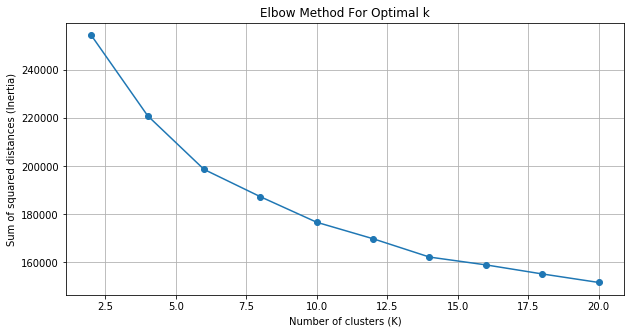

In [39]:
## Plotting the elbow method graph

plt.figure(figsize=(10,5))
plt.plot(K, Sum_of_squared_distances, marker = "o")
plt.xlabel('Number of clusters (K)')
plt.ylabel('Sum of squared distances (Inertia)')
plt.title('Elbow Method For Optimal k')
plt.grid()
plt.show()

## NOTE:

##### `From the graph we can clearly see that  K = 10 can gives the best results`

## Choosing the best K and making the model 

In [40]:
%%time
# Reference : https://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html

# Best k
best_k = 10

# Fitting the model with best_K
from sklearn.cluster import KMeans

# Creating the model
km_cluster = KMeans(n_clusters = best_k, init = 'k-means++', max_iter = 300, n_init = 10, n_jobs = -1)
km_cluster.fit(X_train_5000)

CPU times: user 271 ms, sys: 96.4 ms, total: 367 ms
Wall time: 8min 37s


In [50]:
# Getting the predicted labels
predicted_labels = km_cluster.labels_

# Getting the clusters centers
clust_centers = km_cluster.cluster_centers_

# Printing details
print("The predicted labels : ", predicted_labels, "\nLength of predicted labels matrix : ", predicted_labels.shape)
print("\nLength of cluster centers : ", clust_centers.shape)

The predicted labels :  [0 5 0 ... 8 2 0] 
Length of predicted labels matrix :  (35000,)

Length of cluster centers :  (10, 5000)


# <font color='red'>******STEP 4******</font> 
## Summarize each cluster by manually observing few points from each cluster.

In [56]:
X_train.head(3)

,id,teacher_id,teacher_prefix,school_state,Date,project_grade_category,project_resource_summary,teacher_number_of_previously_posted_projects,price,quantity,clean_categories,clean_subcategories,clean_essays,clean_titles
13339,p098862,eaab492a88fce1013e59ad8b1c8e18f9,Ms.,FL,2016-07-08 18:12:28,Grades 6-8,My students need binders and dividers. Our cla...,5,154.76,8,Math_Science,AppliedSciences EnvironmentalScience,tell forget teach remember involve learn every...,lets get started beginning year supplies
22773,p250633,146efc9008045380c1013a62e076e0eb,Ms.,OH,2016-08-03 21:59:00,Grades PreK-2,My students need the following books to comple...,1,137.67,44,Math_Science Literacy_Language,EnvironmentalScience Literacy,kindergarten time wonder growth students class...,let learn read
107388,p176605,a2a47d3239ca7e5d8235d2dba2983f5f,Mrs.,OH,2017-04-20 22:16:04,Grades PreK-2,My students need headphones for when they are ...,0,4.11,30,Math_Science,Mathematics,26 kiddos came different schools district chan...,headphones help little heads learn


In [61]:
print("Shape of the Train data : ", X_train.shape)
print("Shape of the 5000 feature matrix : ", X_train_5000.shape)

Shape of the Train data :  (35000, 14)
Shape of the 5000 feature matrix :  (35000, 5000)


# NOTE:
1. We have equal number of rows for the train data and the 5000 feature matrix on which our model was trained.
2. We now need to match the clusters and extract the clean_essays from the original X_train data
3. Finally we can visualise the results

In [54]:
## Sorting all the clusters according to the Essay

all_essay = X_train["clean_essays"].values
total_essay = predicted_labels

print("Total number of essays : ", all_essay.shape)
print("Total essays in the clusters : ", total_essay.shape)

Total number of essays :  (35000,)
Total essays in the clusters :  (35000,)


### Creating clusters list and storing the respective cluster points in it

In [64]:
## Clusters are 10 so we will create 10 clusters list

cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []
cluster7 = []
cluster8 = []
cluster9 = []
cluster10 = []


# Looping over the labels
for i in tqdm(range(total_essay.shape[0])):
    
    label = predicted_labels[i]
    
    if label == 0:
        cluster1.append(all_essay[i])
    
    elif label == 1:
        cluster2.append(all_essay[i])
        
    elif label == 2:
        cluster3.append(all_essay[i])
    
    elif label == 3:
        cluster4.append(all_essay[i])
        
    elif label == 4:
        cluster5.append(all_essay[i])
        
    elif label == 5:
        cluster6.append(all_essay[i])
        
    elif label == 6:
        cluster7.append(all_essay[i])
        
    elif label == 7:
        cluster8.append(all_essay[i])
        
    elif label == 8:
        cluster9.append(all_essay[i])
        
    else:
        cluster10.append(all_essay[i])


print("Total number of essays in cluster 1 : ", len(cluster1))
print("Total number of essays in cluster 2 : ", len(cluster2))
print("Total number of essays in cluster 3 : ", len(cluster3))
print("Total number of essays in cluster 4 : ", len(cluster4))
print("Total number of essays in cluster 5 : ", len(cluster5))
print("Total number of essays in cluster 6 : ", len(cluster6))
print("Total number of essays in cluster 7 : ", len(cluster7))
print("Total number of essays in cluster 8 : ", len(cluster8))
print("Total number of essays in cluster 9 : ", len(cluster9))
print("Total number of essays in cluster 10 : ", len(cluster10))

100%|██████████| 35000/35000 [00:00<00:00, 97651.54it/s]

Total number of essays in cluster 1 :  6894
Total number of essays in cluster 2 :  3066
Total number of essays in cluster 3 :  5911
Total number of essays in cluster 4 :  3932
Total number of essays in cluster 5 :  983
Total number of essays in cluster 6 :  5711
Total number of essays in cluster 7 :  1785
Total number of essays in cluster 8 :  26
Total number of essays in cluster 9 :  5588
Total number of essays in cluster 10 :  1104


## Printing some data points (Essays) from each clusters

In [84]:
## Looping over the clusters

print("Essays in Cluster 1 :\n\n")
for i in range(2):
    print(cluster1[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 2 :\n\n")
for i in range(2):
    print(cluster2[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 3 :\n\n")
for i in range(2):
    print(cluster3[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 4 :\n\n")
for i in range(2):
    print(cluster4[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 5 :\n\n")
for i in range(2):
    print(cluster5[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 6 :\n\n")
for i in range(2):
    print(cluster6[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 7 :\n\n")
for i in range(2):
    print(cluster7[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 8 :\n\n")
for i in range(2):
    print(cluster8[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 9 :\n\n")
for i in range(2):
    print(cluster9[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 10 :\n\n")
for i in range(2):
    print(cluster10[i], "\n")

Essays in Cluster 1 :


tell forget teach remember involve learn every day students come ready learn apply new knowledge yet attending school little resources makes difficult implement innovative effective teaching strategies students attend historically low performing school desperate need transformational changes educated majority students teach faced daily struggles poverty violence low expectations despite students profoundly inquisitive resilient creative beyond belief light hearted caring vocal process interpret world point view small portion society opportunity witness come excited work every day much potential promise young minds almost time start 2016 2017 school year students means excitement back school shopping new clothes shoes school supplies unfortunately students serve not always privilege feeling excitement instead may feel stressed embarrassed would like reduce financial strain back school shopping providing major school supplies necessary success class return student

# <font color='red'>******STEP 5******</font> 
## Plotting the word cloud with essay text for each cluster

### Function to plot word cloud

In [87]:
# Reference : https://www.geeksforgeeks.org/generating-word-cloud-python/

from wordcloud import WordCloud

def plot_wordCloud(essays, index):

    # Conerting list to a single string to generate wordcloud
    single_string = essays

    wordcloud = WordCloud(width = 1000, height = 500, background_color = 'black').generate(single_string)

    # Plotting the figure

    plt.figure(figsize=(30,15))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.savefig("Wordcloud/cluster_{}.png".format(index), bbox_inches='tight')
    plt.show()
    plt.close()

CLUSTER 1 : 




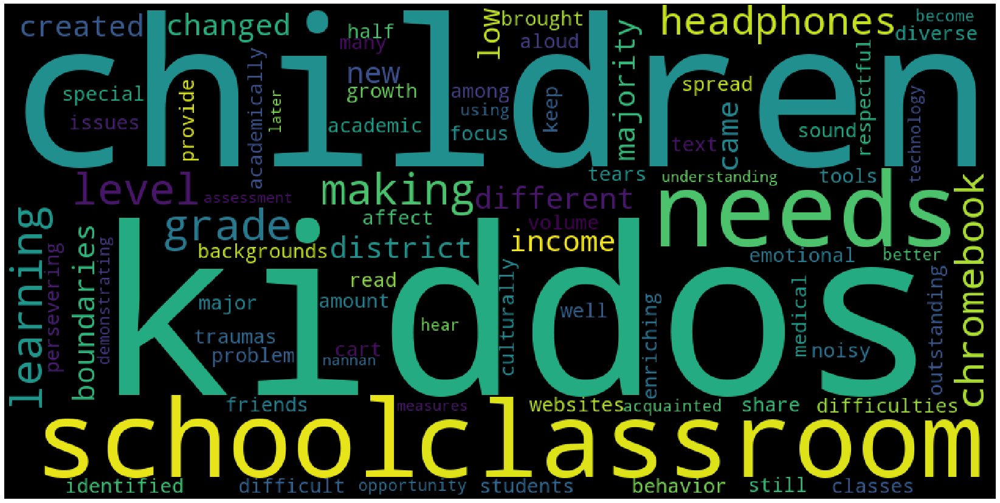


CLUSTER 2 : 




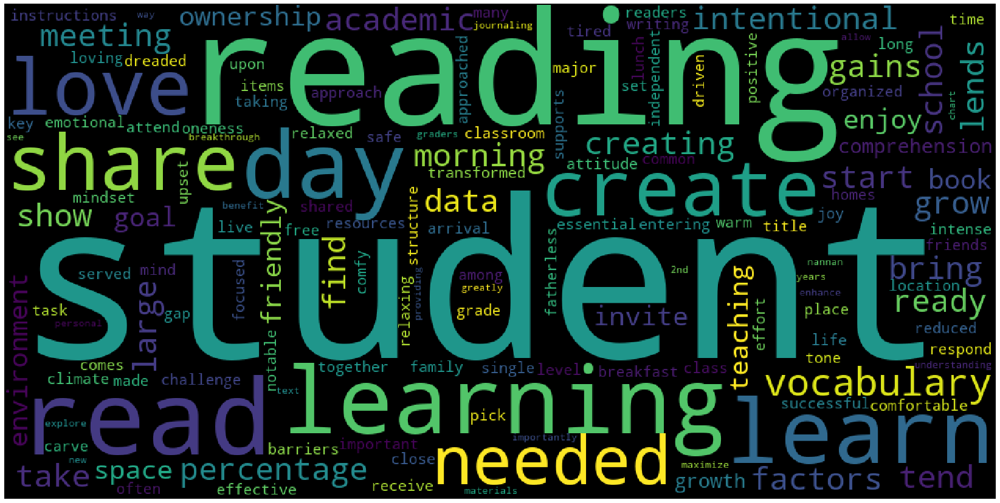


CLUSTER 3 : 




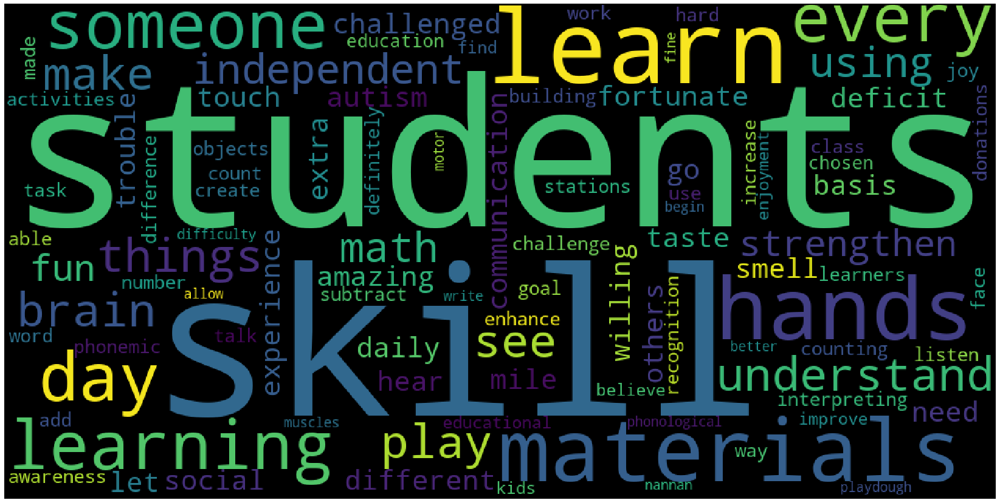


CLUSTER 4 : 




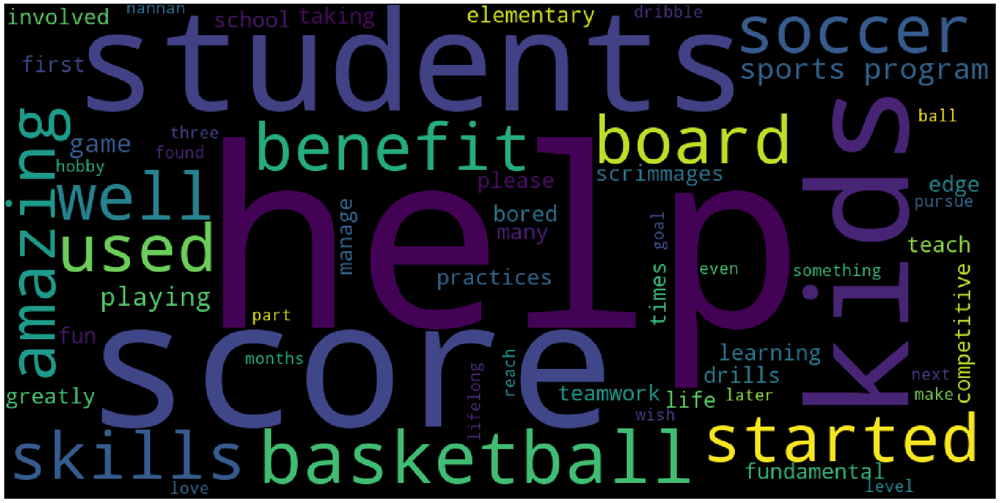


CLUSTER 5 : 




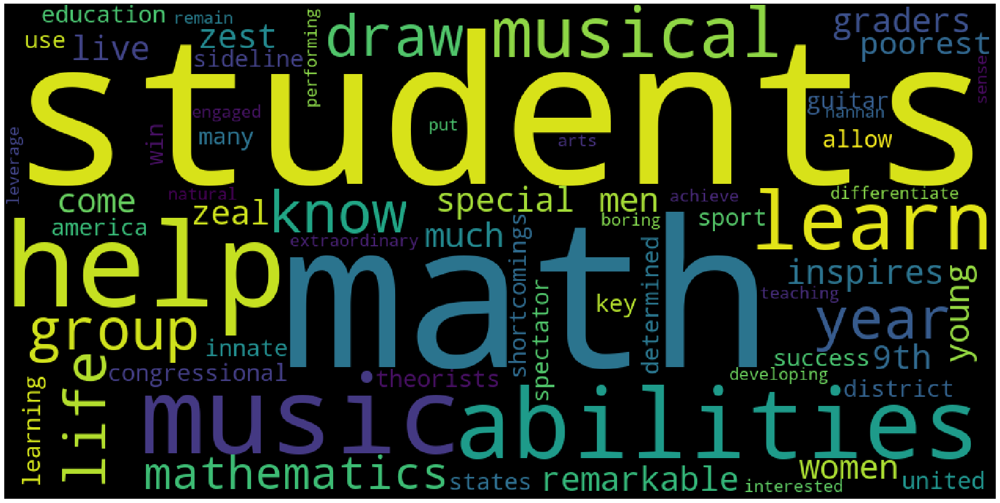


CLUSTER 6 : 




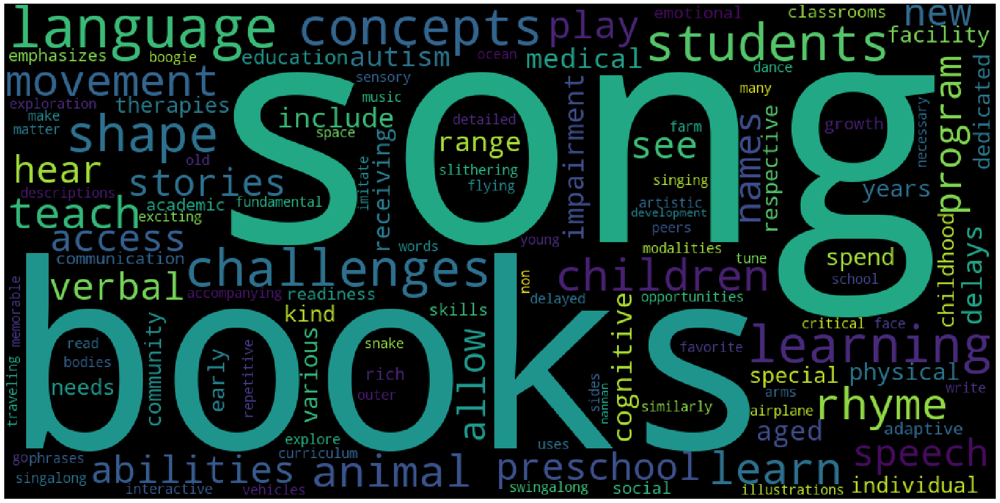


CLUSTER 7 : 




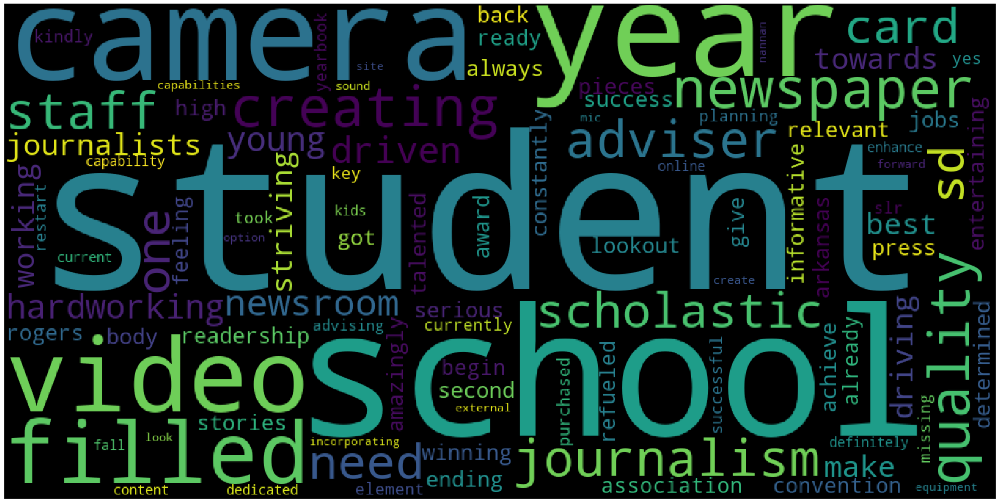


CLUSTER 8 : 




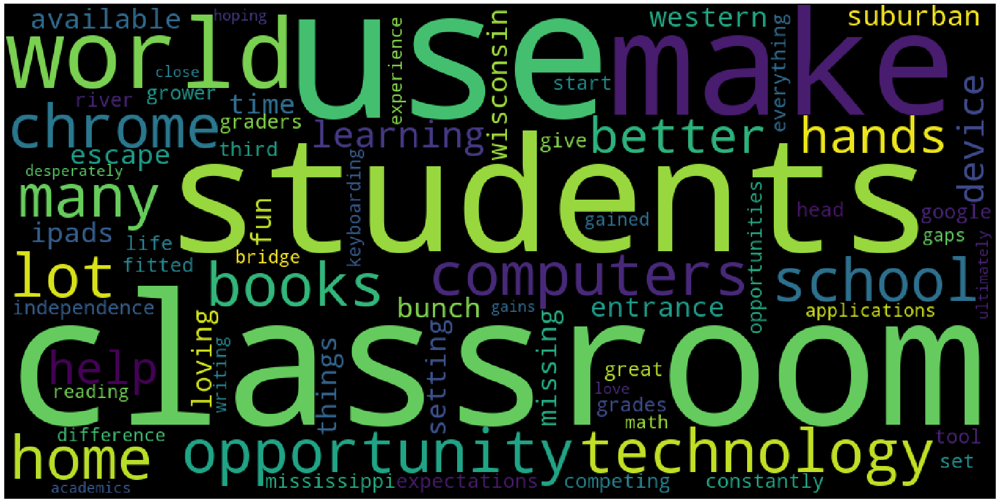


CLUSTER 9 : 




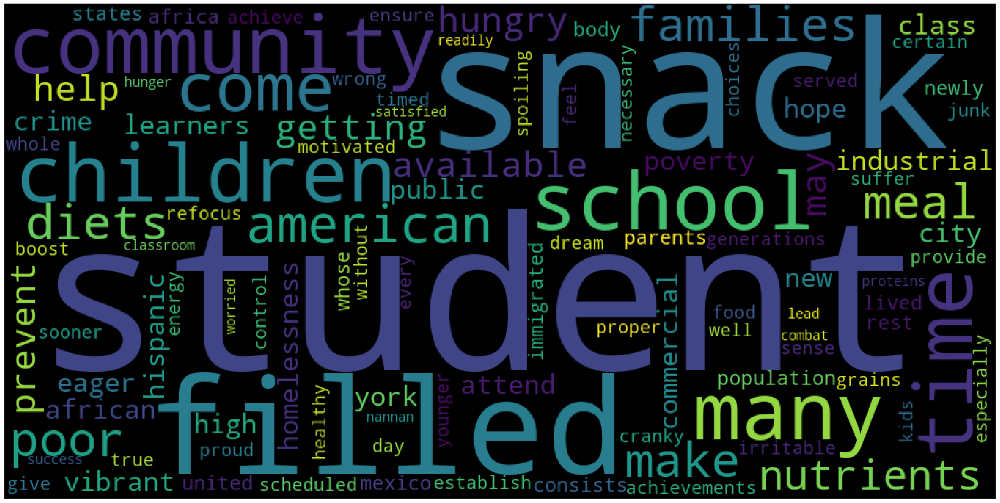


CLUSTER 10 : 




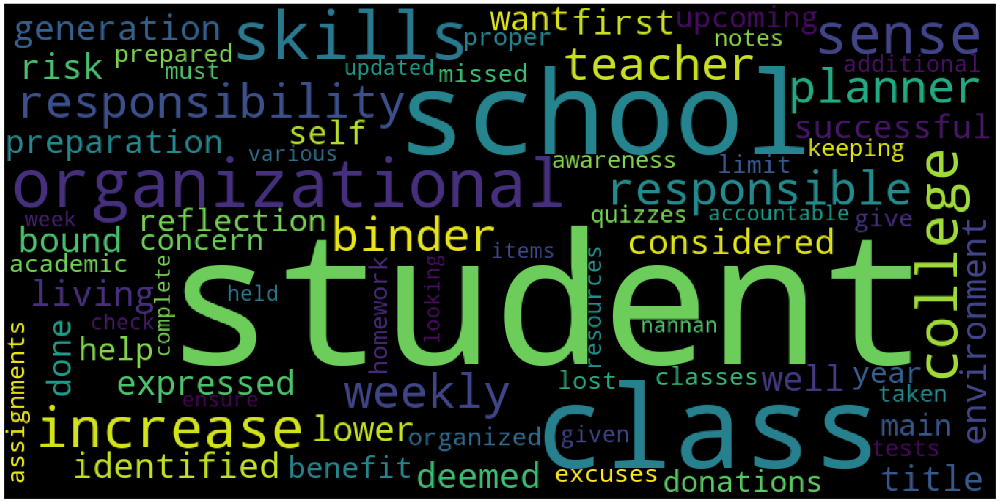

In [88]:
print("CLUSTER 1 : \n\n")
plot_wordCloud(cluster1[1], 1)

print("="*100, "\n")
print("CLUSTER 2 : \n\n")
plot_wordCloud(cluster2[1], 2)

print("="*100, "\n")
print("CLUSTER 3 : \n\n")
plot_wordCloud(cluster3[1], 3)

print("="*100, "\n")
print("CLUSTER 4 : \n\n")
plot_wordCloud(cluster4[1], 4)

print("="*100, "\n")
print("CLUSTER 5 : \n\n")
plot_wordCloud(cluster5[1], 5)

print("="*100, "\n")
print("CLUSTER 6 : \n\n")
plot_wordCloud(cluster6[1], 6)

print("="*100, "\n")
print("CLUSTER 7 : \n\n")
plot_wordCloud(cluster7[1], 7)

print("="*100, "\n")
print("CLUSTER 8 : \n\n")
plot_wordCloud(cluster8[1], 8)

print("="*100, "\n")
print("CLUSTER 9 : \n\n")
plot_wordCloud(cluster9[1], 9)

print("="*100, "\n")
print("CLUSTER 10 : \n\n")
plot_wordCloud(cluster10[1], 10)


# <font color='red'>============================================================</font>

# <font color='red'>******STEP 3******</font> 
# 2. Agglomerative Clustering

## `IMPORTANT :`
### Since the time complexity for Agglomerative Clustering is O(n^3) so we will have to take less number of data points
### Taking 14000 points, with 5000 features to perform Agglomerative Clustering

In [37]:
print("Shape of the original Data matrix : ", X_train.shape)
print("Shape of the Hstacked feature Data Matrix : ", X_train_5000.shape)

Shape of the original Data matrix :  (14000, 14)
Shape of the Hstacked feature Data Matrix :  (14000, 5000)


## NOTE:
1. Since the dimension of the matrix is too high so it will be impossible for us to visualise the clusters using dendograms.
2. We will use Sklearn's "AgglomerativeClustering" class and will manually specify the number of clusters.

## ******** `Let's try n_clusters = 2` ********

In [38]:
%%time
## Importing the libraries
from sklearn.cluster import AgglomerativeClustering

agg_cluster = AgglomerativeClustering(n_clusters = 2, affinity = 'euclidean', linkage = 'ward')
agg_cluster.fit(X_train_5000.toarray())

# Getting the predicted labels
predicted_labels = agg_cluster.labels_

# Printing details
print("The predicted labels : ", predicted_labels, "\nLength of predicted labels matrix : ", predicted_labels.shape)

The predicted labels :  [0 0 0 ... 0 0 0] 
Length of predicted labels matrix :  (14000,)
CPU times: user 7min 5s, sys: 1.76 s, total: 7min 6s
Wall time: 7min 7s


# <font color='red'>******STEP 4******</font> 
## Summarize each cluster by manually observing few points from each cluster.

In [44]:
print("Shape of the Train data : ", X_train.shape)
print("Shape of the 5000 feature matrix : ", X_train_5000.shape)

Shape of the Train data :  (14000, 14)
Shape of the 5000 feature matrix :  (14000, 5000)


In [45]:
## Sorting all the clusters according to the Essay

all_essay = X_train["clean_essays"].values
total_essay = predicted_labels

print("Total number of essays : ", all_essay.shape)
print("Total essays in the clusters : ", total_essay.shape)

Total number of essays :  (14000,)
Total essays in the clusters :  (14000,)


### Creating clusters list and storing the respective cluster points in it

In [46]:
## Clusters are 10 so we will create 10 clusters list

cluster1 = []
cluster2 = []

# Looping over the labels
for i in tqdm(range(total_essay.shape[0])):
    
    label = predicted_labels[i]
    
    if label == 0:
        cluster1.append(all_essay[i])
    
    else:
        cluster2.append(all_essay[i])
        

print("Total number of essays in cluster 1 : ", len(cluster1))
print("Total number of essays in cluster 2 : ", len(cluster2))

100%|██████████| 14000/14000 [00:00<00:00, 298190.43it/s]

Total number of essays in cluster 1 :  12983
Total number of essays in cluster 2 :  1017


## Printing some data points (Essays) from each clusters

In [47]:
## Looping over the clusters

print("Essays in Cluster 1 :\n\n")
for i in range(2):
    print(cluster1[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 2 :\n\n")
for i in range(2):
    print(cluster2[i], "\n")

Essays in Cluster 1 :


reading intervention teacher large title 1 campus service k 5th grade students risk students try instill love reading every student see 45 students 20 45 minutes students come low income families experiences outside home reading one way open door bring world students not opportunities many children reading help learn world students mostly low income families range kindergarten fifth grade students include special education students english language learners 3rd 4th 5th graders made progress year reading 1st 2nd grade levels 3rd graders also made progress ready early chapter books also 4th 5th graders reading grade level students become voracious readers run low books need tell students best way become better reading read believe allowing students choose books reading workshop structure along book choice really motivates read turn makes huge difference literacy success feeling accomplishment time finish book nannan 

kindergarten teacher 26 students yearn learn e

# <font color='red'>******STEP 5******</font> 
## Plotting the word cloud with essay text for each cluster

### Function to plot word cloud

In [48]:
# Reference : https://www.geeksforgeeks.org/generating-word-cloud-python/

from wordcloud import WordCloud

def plot_wordCloud(essays, index):

    # Conerting list to a single string to generate wordcloud
    single_string = essays

    wordcloud = WordCloud(width = 1000, height = 500, background_color = 'black').generate(single_string)

    # Plotting the figure

    plt.figure(figsize=(30,15))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.savefig("Wordcloud/clusterHC_{}.png".format(index), bbox_inches='tight')
    plt.show()
    plt.close()

CLUSTER 1 : 




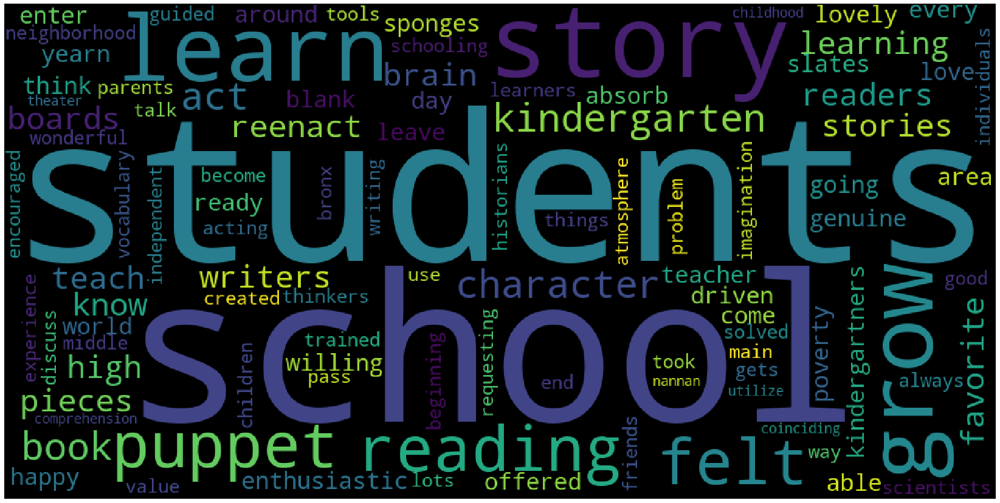


CLUSTER 2 : 




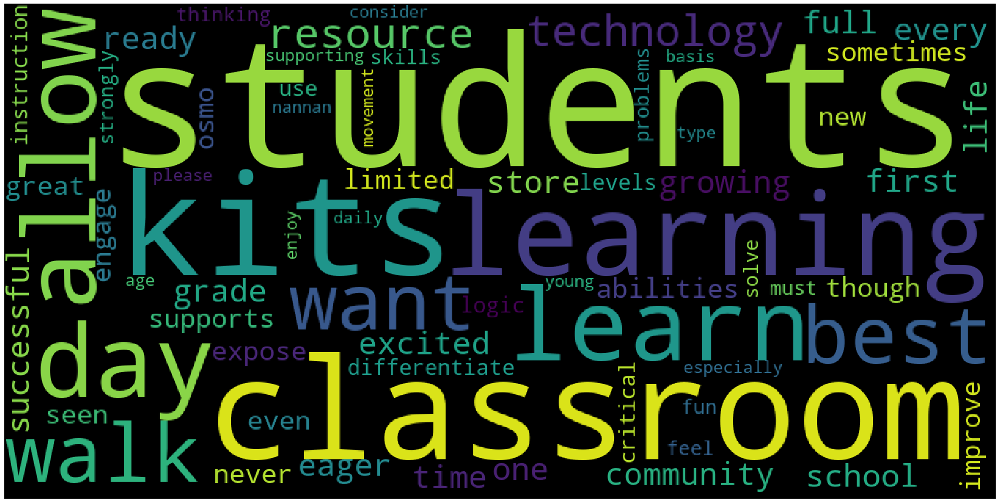

In [49]:
print("CLUSTER 1 : \n\n")
plot_wordCloud(cluster1[1], 1)

print("="*100, "\n")
print("CLUSTER 2 : \n\n")
plot_wordCloud(cluster2[1], 2)

## ********`Let's try n_clusters = 5`********

In [50]:
%%time
## Importing the libraries
from sklearn.cluster import AgglomerativeClustering

agg_cluster = AgglomerativeClustering(n_clusters = 5, affinity = 'euclidean', linkage = 'ward')
agg_cluster.fit(X_train_5000.toarray())

# Getting the predicted labels
predicted_labels = agg_cluster.labels_

# Printing details
print("The predicted labels : ", predicted_labels, "\nLength of predicted labels matrix : ", predicted_labels.shape)

The predicted labels :  [0 0 2 ... 0 4 0] 
Length of predicted labels matrix :  (14000,)
CPU times: user 6min 49s, sys: 1.28 s, total: 6min 50s
Wall time: 6min 50s


# <font color='red'>******STEP 4******</font> 
## Summarize each cluster by manually observing few points from each cluster.

In [51]:
print("Shape of the Train data : ", X_train.shape)
print("Shape of the 5000 feature matrix : ", X_train_5000.shape)

Shape of the Train data :  (14000, 14)
Shape of the 5000 feature matrix :  (14000, 5000)


In [52]:
## Sorting all the clusters according to the Essay

all_essay = X_train["clean_essays"].values
total_essay = predicted_labels

print("Total number of essays : ", all_essay.shape)
print("Total essays in the clusters : ", total_essay.shape)

Total number of essays :  (14000,)
Total essays in the clusters :  (14000,)


### Creating clusters list and storing the respective cluster points in it

In [53]:
## Clusters are 10 so we will create 10 clusters list

cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []


# Looping over the labels
for i in tqdm(range(total_essay.shape[0])):
    
    label = predicted_labels[i]
    
    if label == 0:
        cluster1.append(all_essay[i])
    
    elif label == 1:
        cluster2.append(all_essay[i])
        
    elif label == 2:
        cluster3.append(all_essay[i])
    
    elif label == 3:
        cluster4.append(all_essay[i])
        
    else:
        cluster5.append(all_essay[i])


print("Total number of essays in cluster 1 : ", len(cluster1))
print("Total number of essays in cluster 2 : ", len(cluster2))
print("Total number of essays in cluster 3 : ", len(cluster3))
print("Total number of essays in cluster 4 : ", len(cluster4))
print("Total number of essays in cluster 5 : ", len(cluster5))

100%|██████████| 14000/14000 [00:00<00:00, 256489.77it/s]

Total number of essays in cluster 1 :  8558
Total number of essays in cluster 2 :  1017
Total number of essays in cluster 3 :  1240
Total number of essays in cluster 4 :  97
Total number of essays in cluster 5 :  3088


## Printing some data points (Essays) from each clusters

In [56]:
## Looping over the clusters

print("Essays in Cluster 1 :\n\n")
for i in range(2):
    print(cluster1[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 2 :\n\n")
for i in range(2):
    print(cluster2[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 3 :\n\n")
for i in range(2):
    print(cluster3[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 4 :\n\n")
for i in range(2):
    print(cluster4[i], "\n")

print("="*100, "\n")
    
print("Essays in Cluster 5 :\n\n")
for i in range(2):
    print(cluster5[i], "\n")
    

Essays in Cluster 1 :


reading intervention teacher large title 1 campus service k 5th grade students risk students try instill love reading every student see 45 students 20 45 minutes students come low income families experiences outside home reading one way open door bring world students not opportunities many children reading help learn world students mostly low income families range kindergarten fifth grade students include special education students english language learners 3rd 4th 5th graders made progress year reading 1st 2nd grade levels 3rd graders also made progress ready early chapter books also 4th 5th graders reading grade level students become voracious readers run low books need tell students best way become better reading read believe allowing students choose books reading workshop structure along book choice really motivates read turn makes huge difference literacy success feeling accomplishment time finish book nannan 

kindergarten teacher 26 students yearn learn e

# <font color='red'>******STEP 5******</font> 
## Plotting the word cloud with essay text for each cluster

### Function to plot word cloud

In [57]:
# Reference : https://www.geeksforgeeks.org/generating-word-cloud-python/

from wordcloud import WordCloud

def plot_wordCloud(essays, index):

    # Conerting list to a single string to generate wordcloud
    single_string = essays

    wordcloud = WordCloud(width = 1000, height = 500, background_color = 'black').generate(single_string)

    # Plotting the figure

    plt.figure(figsize=(30,15))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.savefig("Wordcloud/clusterHC5_{}.png".format(index), bbox_inches='tight')
    plt.show()
    plt.close()

CLUSTER 1 : 




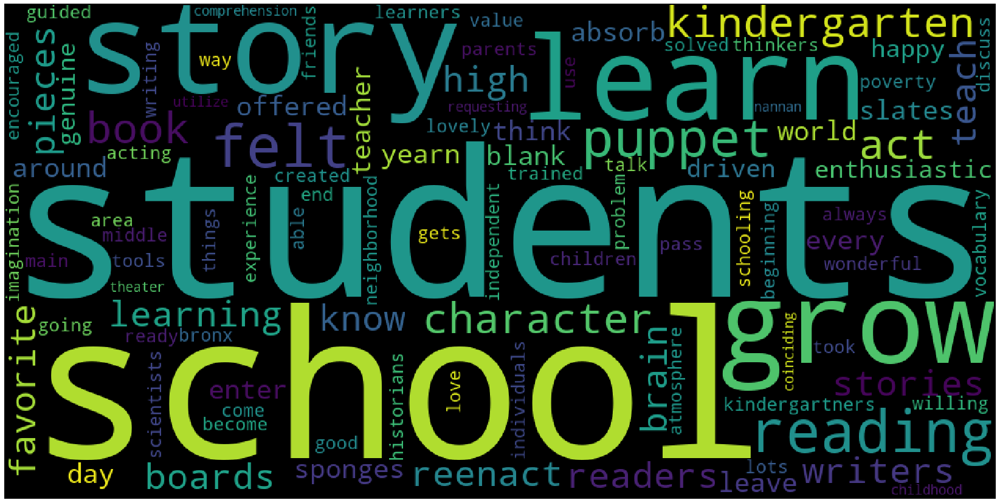


CLUSTER 2 : 




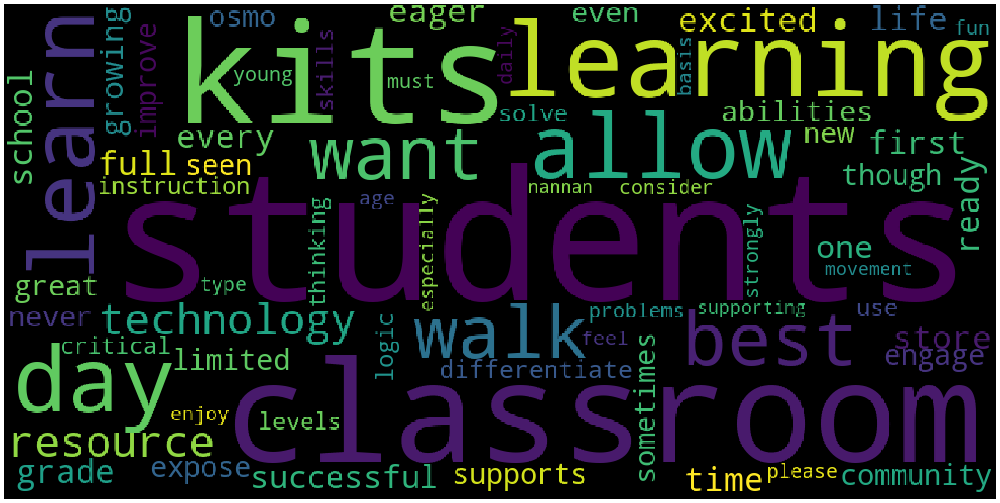


CLUSTER 3 : 




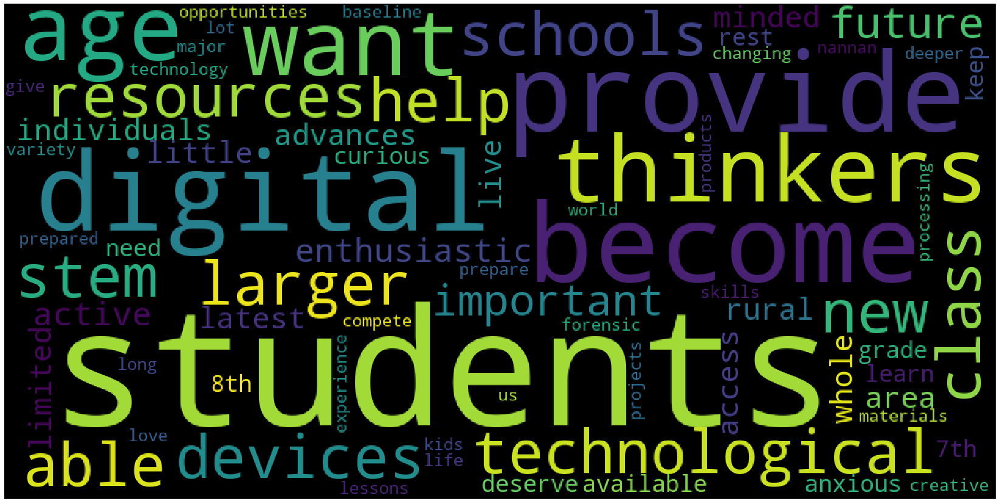


CLUSTER 4 : 




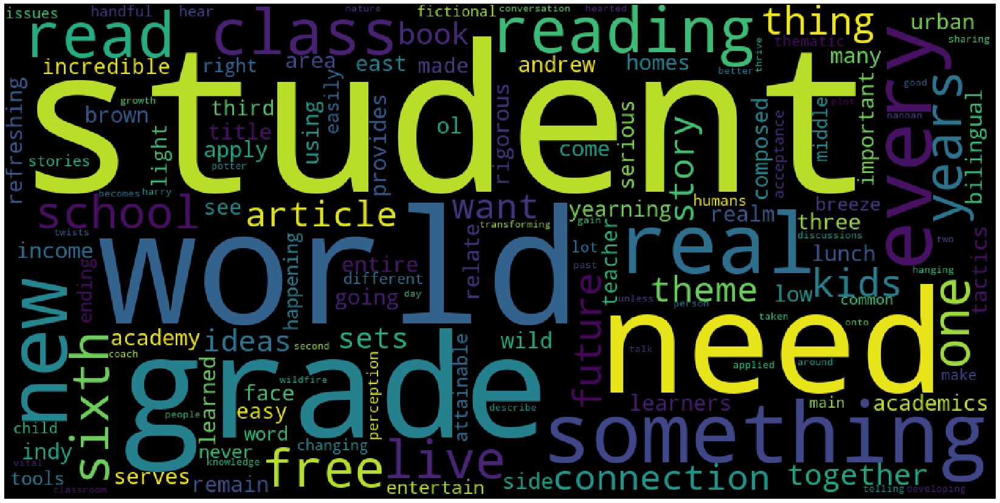


CLUSTER 5 : 




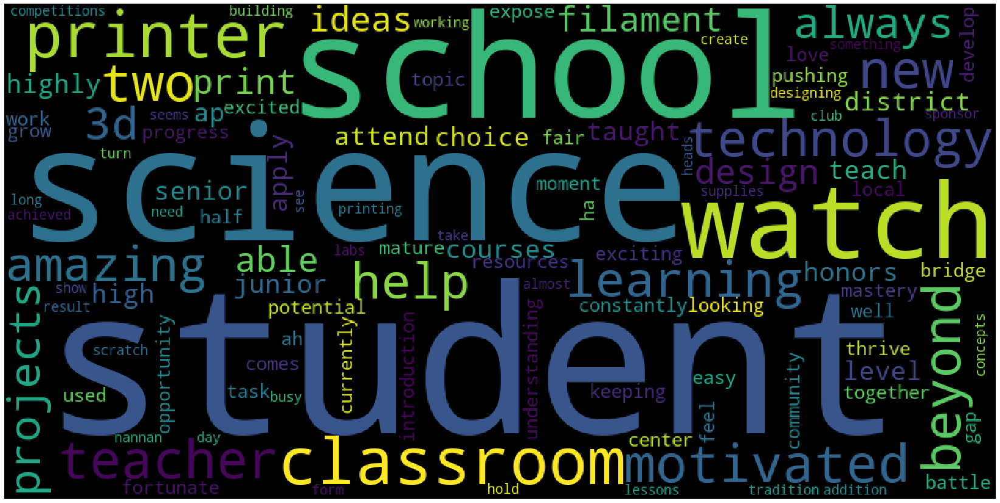

In [58]:
print("CLUSTER 1 : \n\n")
plot_wordCloud(cluster1[1], 1)

print("="*100, "\n")
print("CLUSTER 2 : \n\n")
plot_wordCloud(cluster2[1], 2)

print("="*100, "\n")
print("CLUSTER 3 : \n\n")
plot_wordCloud(cluster3[1], 3)

print("="*100, "\n")
print("CLUSTER 4 : \n\n")
plot_wordCloud(cluster4[1], 4)

print("="*100, "\n")
print("CLUSTER 5 : \n\n")
plot_wordCloud(cluster5[1], 5)

## ********`Let's try n_clusters = 7`********

In [59]:
%%time
## Importing the libraries
from sklearn.cluster import AgglomerativeClustering

agg_cluster = AgglomerativeClustering(n_clusters = 7, affinity = 'euclidean', linkage = 'ward')
agg_cluster.fit(X_train_5000.toarray())

# Getting the predicted labels
predicted_labels = agg_cluster.labels_

# Printing details
print("The predicted labels : ", predicted_labels, "\nLength of predicted labels matrix : ", predicted_labels.shape)

The predicted labels :  [0 0 2 ... 5 1 5] 
Length of predicted labels matrix :  (14000,)
CPU times: user 6min 39s, sys: 1.32 s, total: 6min 40s
Wall time: 6min 40s


# <font color='red'>******STEP 4******</font> 
## Summarize each cluster by manually observing few points from each cluster.

In [60]:
print("Shape of the Train data : ", X_train.shape)
print("Shape of the 5000 feature matrix : ", X_train_5000.shape)

Shape of the Train data :  (14000, 14)
Shape of the 5000 feature matrix :  (14000, 5000)


In [61]:
## Sorting all the clusters according to the Essay

all_essay = X_train["clean_essays"].values
total_essay = predicted_labels

print("Total number of essays : ", all_essay.shape)
print("Total essays in the clusters : ", total_essay.shape)

Total number of essays :  (14000,)
Total essays in the clusters :  (14000,)


### Creating clusters list and storing the respective cluster points in it

In [62]:
## Clusters are 10 so we will create 10 clusters list

cluster1 = []
cluster2 = []
cluster3 = []
cluster4 = []
cluster5 = []
cluster6 = []
cluster7 = []

# Looping over the labels
for i in tqdm(range(total_essay.shape[0])):
    
    label = predicted_labels[i]
    
    if label == 0:
        cluster1.append(all_essay[i])
    
    elif label == 1:
        cluster2.append(all_essay[i])
        
    elif label == 2:
        cluster3.append(all_essay[i])
    
    elif label == 3:
        cluster4.append(all_essay[i])
        
    elif label == 4:
        cluster5.append(all_essay[i])
    
    elif label == 5:
        cluster6.append(all_essay[i])
        
    else:
        cluster7.append(all_essay[i])


print("Total number of essays in cluster 1 : ", len(cluster1))
print("Total number of essays in cluster 2 : ", len(cluster2))
print("Total number of essays in cluster 3 : ", len(cluster3))
print("Total number of essays in cluster 4 : ", len(cluster4))
print("Total number of essays in cluster 5 : ", len(cluster5))
print("Total number of essays in cluster 6 : ", len(cluster6))
print("Total number of essays in cluster 7 : ", len(cluster7))

100%|██████████| 14000/14000 [00:00<00:00, 386104.10it/s]

Total number of essays in cluster 1 :  3605
Total number of essays in cluster 2 :  3088
Total number of essays in cluster 3 :  1240
Total number of essays in cluster 4 :  97
Total number of essays in cluster 5 :  939
Total number of essays in cluster 6 :  4953
Total number of essays in cluster 7 :  78


## Printing some data points (Essays) from each clusters

In [63]:
## Looping over the clusters

print("Essays in Cluster 1 :\n\n")
for i in range(2):
    print(cluster1[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 2 :\n\n")
for i in range(2):
    print(cluster2[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 3 :\n\n")
for i in range(2):
    print(cluster3[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 4 :\n\n")
for i in range(2):
    print(cluster4[i], "\n")

print("="*100, "\n")
    
print("Essays in Cluster 5 :\n\n")
for i in range(2):
    print(cluster5[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 6 :\n\n")
for i in range(2):
    print(cluster6[i], "\n")

print("="*100, "\n")
    
print("Essays in Cluster 7 :\n\n")
for i in range(2):
    print(cluster7[i], "\n")

Essays in Cluster 1 :


reading intervention teacher large title 1 campus service k 5th grade students risk students try instill love reading every student see 45 students 20 45 minutes students come low income families experiences outside home reading one way open door bring world students not opportunities many children reading help learn world students mostly low income families range kindergarten fifth grade students include special education students english language learners 3rd 4th 5th graders made progress year reading 1st 2nd grade levels 3rd graders also made progress ready early chapter books also 4th 5th graders reading grade level students become voracious readers run low books need tell students best way become better reading read believe allowing students choose books reading workshop structure along book choice really motivates read turn makes huge difference literacy success feeling accomplishment time finish book nannan 

kindergarten teacher 26 students yearn learn e

# <font color='red'>******STEP 5******</font> 
## Plotting the word cloud with essay text for each cluster

### Function to plot Wordcloud

In [64]:
# Reference : https://www.geeksforgeeks.org/generating-word-cloud-python/

from wordcloud import WordCloud

def plot_wordCloud(essays, index):

    # Conerting list to a single string to generate wordcloud
    single_string = essays

    wordcloud = WordCloud(width = 1000, height = 500, background_color = 'black').generate(single_string)

    # Plotting the figure

    plt.figure(figsize=(30,15))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.savefig("Wordcloud/clusterHC7_{}.png".format(index), bbox_inches='tight')
    plt.show()
    plt.close()

CLUSTER 1 : 




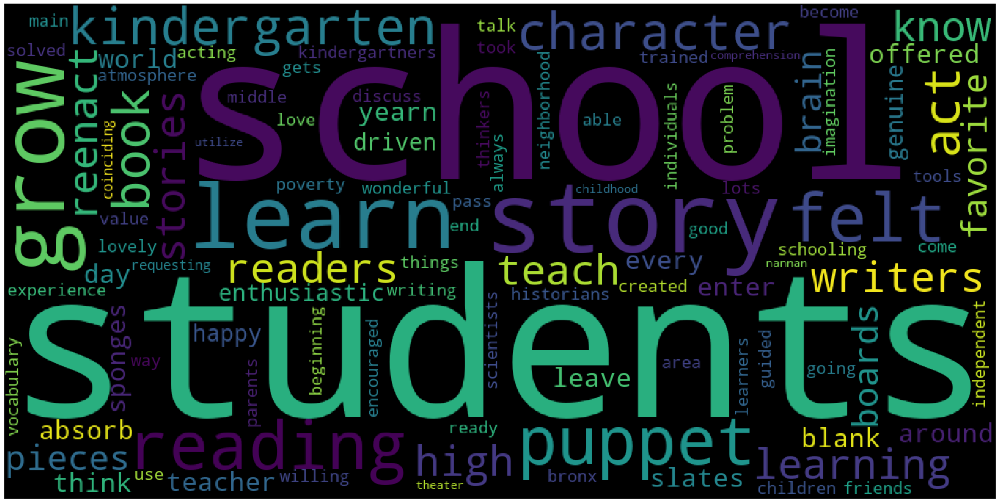


CLUSTER 2 : 




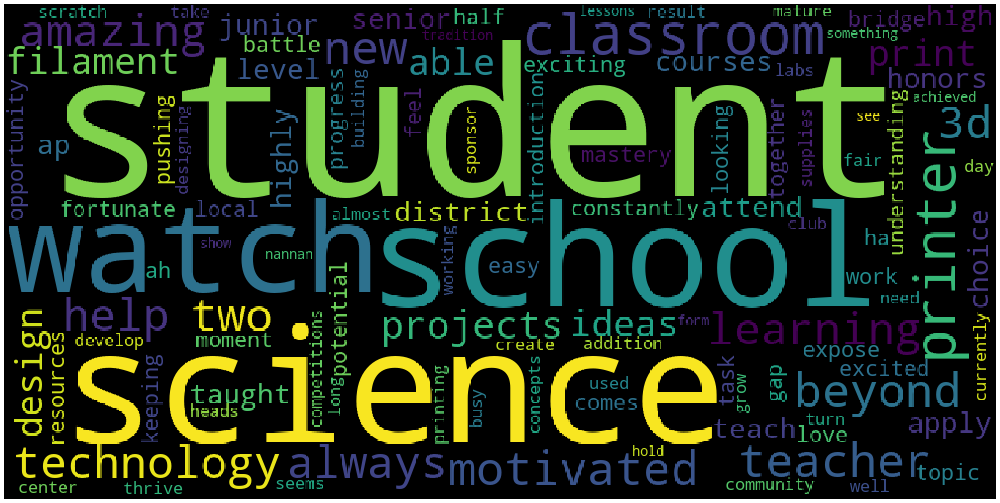


CLUSTER 3 : 




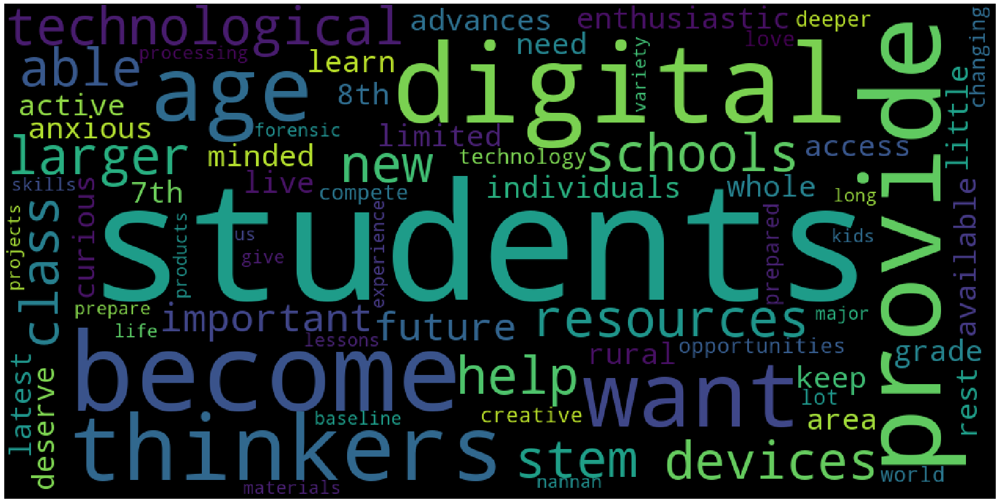


CLUSTER 4 : 




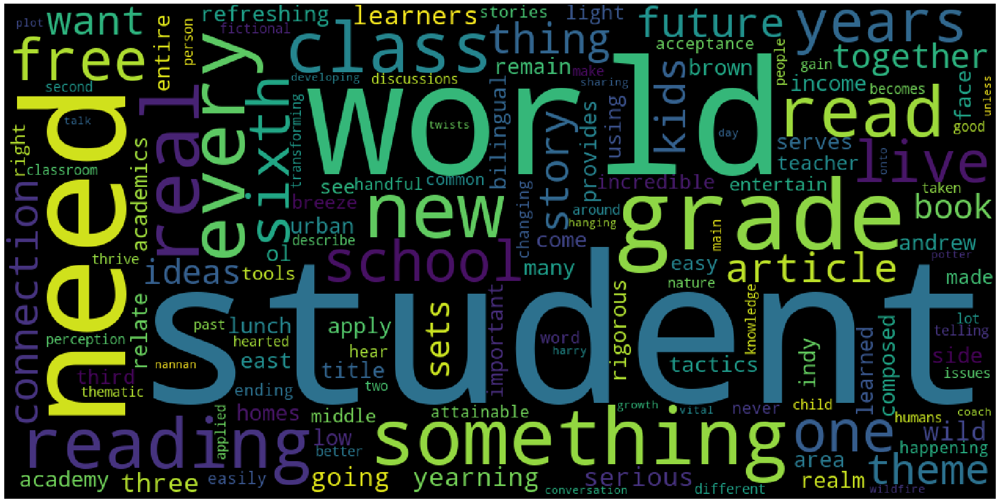


CLUSTER 5 : 




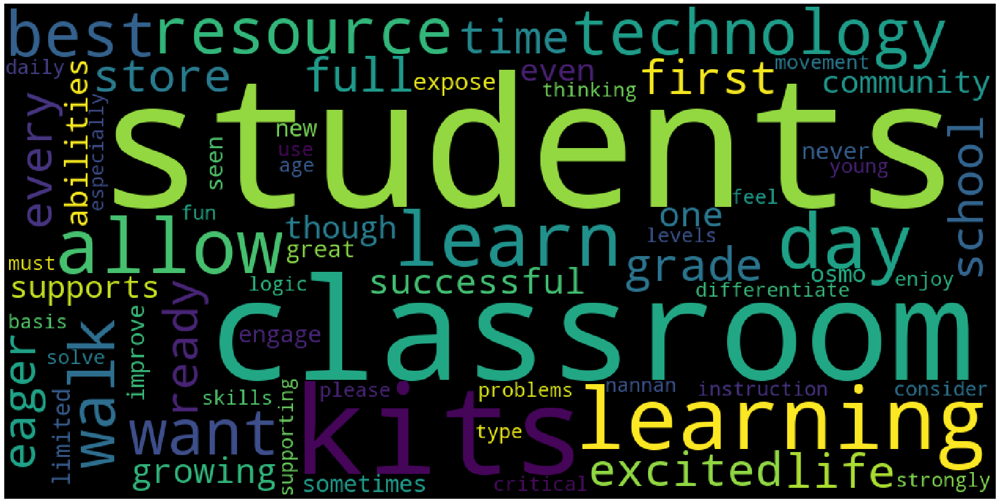


CLUSTER 6 : 




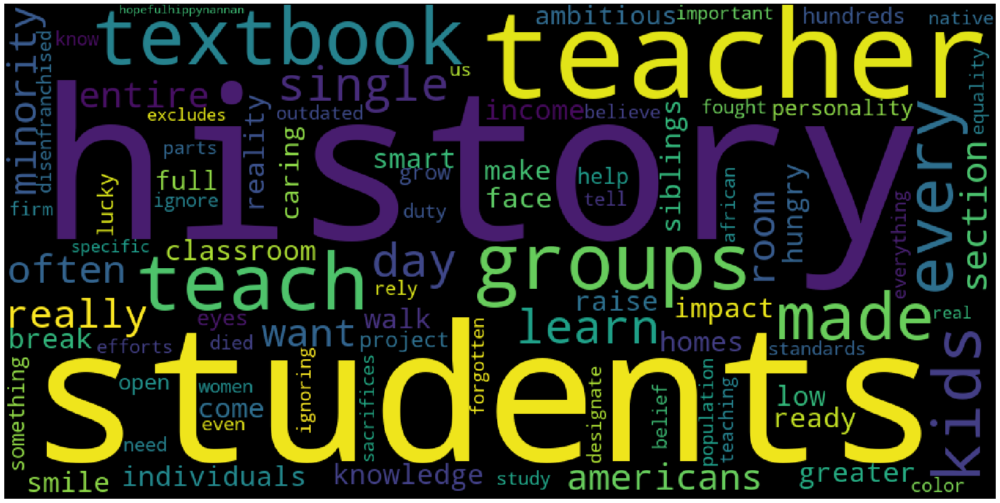


CLUSTER 7 : 




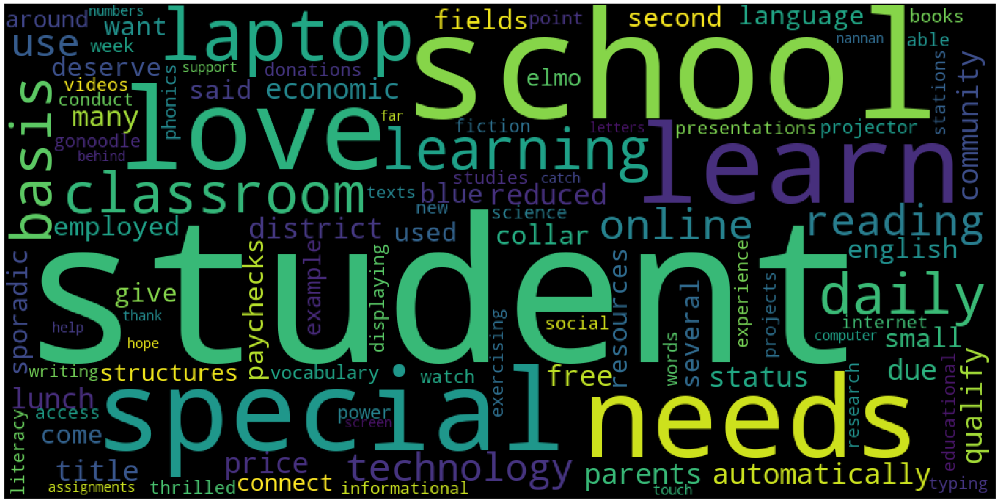

In [66]:
print("CLUSTER 1 : \n\n")
plot_wordCloud(cluster1[1], 1)

print("="*100, "\n")
print("CLUSTER 2 : \n\n")
plot_wordCloud(cluster2[1], 2)

print("="*100, "\n")
print("CLUSTER 3 : \n\n")
plot_wordCloud(cluster3[1], 3)

print("="*100, "\n")
print("CLUSTER 4 : \n\n")
plot_wordCloud(cluster4[1], 4)

print("="*100, "\n")
print("CLUSTER 5 : \n\n")
plot_wordCloud(cluster5[1], 5)

print("="*100, "\n")
print("CLUSTER 6 : \n\n")
plot_wordCloud(cluster6[1], 6)

print("="*100, "\n")
print("CLUSTER 7 : \n\n")
plot_wordCloud(cluster7[1], 7)

# <font color='red'>============================================================</font> 

# <font color='red'>******STEP 3******</font> 
# 2. DBSCAN Clustering

### Taking 14000 data points and 5000 dimensions

In [37]:
print("Shape of the original Data matrix : ", X_train.shape)
print("Shape of the Hstacked feature Data Matrix : ", X_train_5000.shape)

Shape of the original Data matrix :  (14000, 14)
Shape of the Hstacked feature Data Matrix :  (14000, 5000)


### Creating a function to calculate the nearest square distance

In [38]:
def n_square_distance(n_points, n_array):
    
    """This function returns the nearest quare distance between the points in a given matrix"""
    
    # Distance matrix
    distance_matrix = []
    
    for point in tqdm(n_array):
        dist = np.sort(np.sum((n_array - point)**2, axis=1), axis=None)
        distance_matrix.append(dist[n_points])
        
    return np.sqrt(np.array(distance_matrix))

## NOTE:
#### `As we know typically minimun sample points are taken as [2*d] (where d = dimension of the data matrix)`

In [39]:
# Calculating the minimum points
min_pts = 2 * X_train_5000.shape[1]

# Calculating the distance
nearest_distance = n_square_distance(min_pts, X_train_5000.toarray())

# Sorting the distance so that it will help to find the best eps in the plot by giving a curve like plot
distance = np.sort(nearest_distance)

# genereting all possible point in range of the essays
total_essay = X_train_5000.shape[0]
data_points = []
for i in range(total_essay):
    data_points.append(i)

100%|██████████| 14000/14000 [1:26:12<00:00,  2.75it/s]


In [43]:
# ## Saving the data
# distance_df = pd.DataFrame(distance)
# distance_df.to_csv("diatances.csv", index = False)

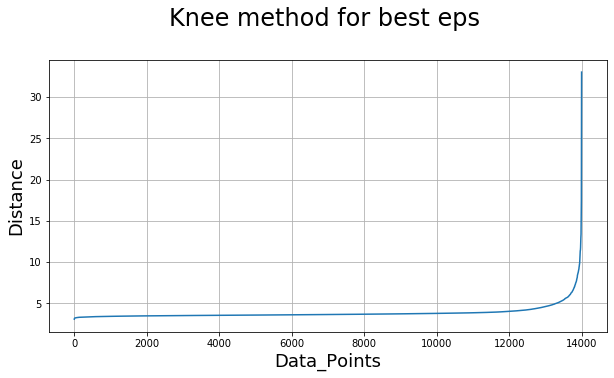

In [45]:
# Drawing Distance VS Data_Points plot

plt.figure(figsize=(10,5))
plt.plot(data_points, distance)
plt.xlabel('Data_Points',size=18)
plt.ylabel('Distance',size=18)
plt.title('Knee method for best eps \n',size=24)
plt.grid()
plt.show()

## NOTE:
1. From the graph we can see that eps = 8 would be a good option

In [49]:
%%time
## Importing the libraries
from sklearn.cluster import DBSCAN

dbscan_cluster = DBSCAN(eps = 8, min_samples=min_pts, metric='euclidean', n_jobs = -1) 
dbscan_cluster.fit(X_train_5000.toarray())

# Getting the predicted labels
predicted_labels = dbscan_cluster.labels_

# Printing details
print("The predicted labels : ", predicted_labels, "\nLength of predicted labels matrix : ", predicted_labels.shape)

The predicted labels :  [0 0 0 ... 0 0 0] 
Length of predicted labels matrix :  (14000,)
CPU times: user 50min 7s, sys: 2.25 s, total: 50min 9s
Wall time: 12min 45s


# <font color='red'>******STEP 4******</font> 
## Summarize each cluster by manually observing few points from each cluster.

In [50]:
## Sorting all the clusters according to the Essay

all_essay = X_train["clean_essays"].values
total_essay = predicted_labels

print("Total number of essays : ", all_essay.shape)
print("Total essays in the clusters : ", total_essay.shape)

Total number of essays :  (14000,)
Total essays in the clusters :  (14000,)


In [53]:
## Number of clusters
clusters_made = set(predicted_labels)

print("The clusters formed are : ", clusters_made)

The clusters formed are :  {0, -1}


### Creating clusters list and storing the respective cluster points in it

In [52]:
## Clusters are 10 so we will create 10 clusters list

cluster1 = []
outliers = []

# Looping over the labels
for i in tqdm(range(total_essay.shape[0])):
    
    label = predicted_labels[i]
    
    if label == -1:
        outliers.append(all_essay[i])
    
    elif label == 0:
        cluster1.append(all_essay[i])

print("Outlier datapoints : ", len(outliers))
print("Total number of essays in cluster 1 : ", len(cluster1))

100%|██████████| 14000/14000 [00:00<00:00, 635067.61it/s]

Outlier datapoints :  10
Total number of essays in cluster 1 :  13990


## Printing some data points (Essays) from each clusters

In [54]:
## Looping over the clusters

print("Essays which are outiers :\n\n")
for i in range(2):
    print(outliers[i], "\n")
    
print("="*100, "\n")

print("Essays in Cluster 1 :\n\n")
for i in range(2):
    print(cluster1[i], "\n")

Essays which are outiers :


art teacher high poverty area north eastern kansas many students limited understanding basic techniques concepts art program watercolor drawing techniques ceramics much strong fine arts program power reach students not normally reached especially students lower socioeconomic status well structured fine art programs solid foundation includes painting drawing ceramics etc foundational building blocks allows students make sense world live interpret hear see feel touch providing crucial building blocks art education experiencing various mediums opportunities power provide various multiple ways self expression creating artwork students able continue path academic excellence advance studies processes taught fine arts program help develop skills coping ambiguities uncertainties present everyday affairs human existence watercolor basic medium creates foundation advanced learning opportunities art student experienced strong foundation art turn builds student percept

# <font color='red'>******STEP 5******</font> 
## Plotting the word cloud with essay text for each cluster

### Function to plot wordcloud

In [55]:
# Reference : https://www.geeksforgeeks.org/generating-word-cloud-python/

from wordcloud import WordCloud

def plot_wordCloud(essays, index):

    # Conerting list to a single string to generate wordcloud
    single_string = essays

    wordcloud = WordCloud(width = 1000, height = 500, background_color = 'black').generate(single_string)

    # Plotting the figure

    plt.figure(figsize=(30,15))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.savefig("Wordcloud/clusterDB_{}.png".format(index), bbox_inches='tight')
    plt.show()
    plt.close()

CLUSTER 1 : 




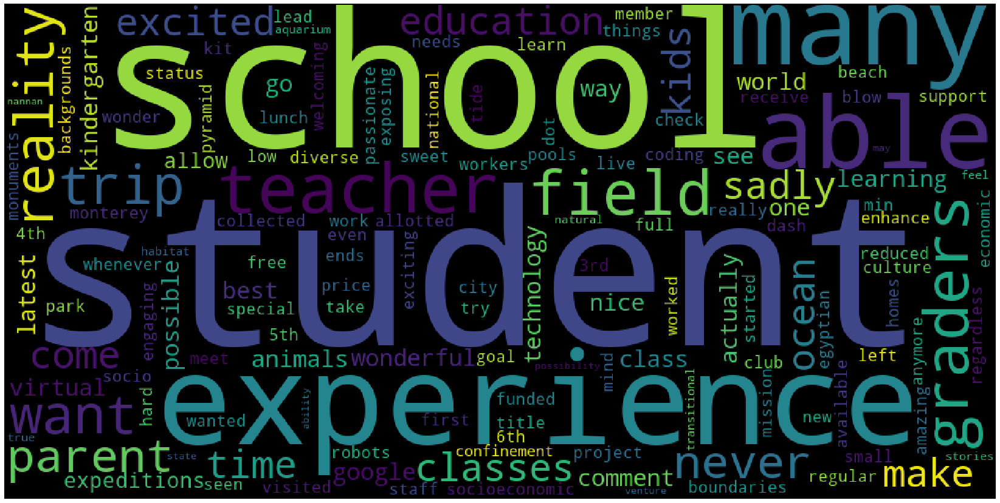


CLUSTER 2 : 




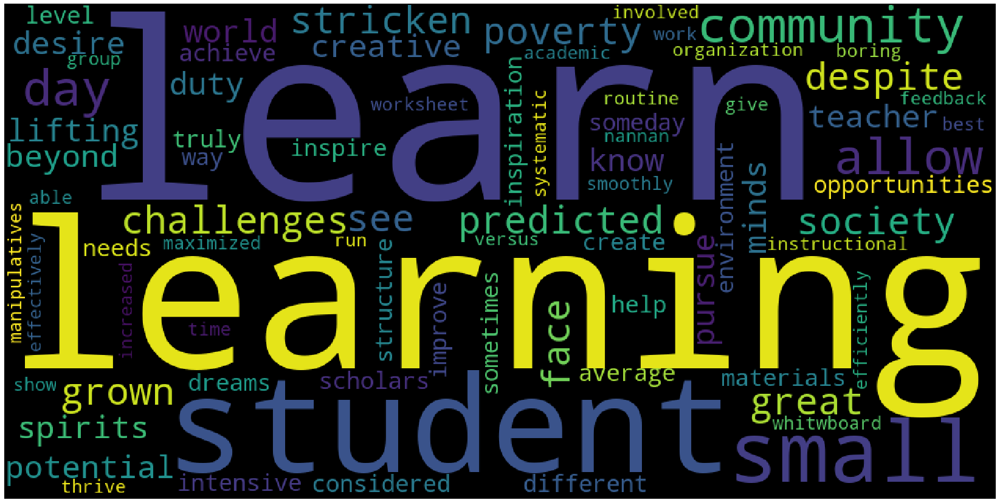

In [56]:
print("CLUSTER 1 : \n\n")
plot_wordCloud(outliers[1], 0)

print("="*100, "\n")
print("CLUSTER 2 : \n\n")
plot_wordCloud(cluster1[1], 1)

# CONCLUSION:

In [2]:
#importing library
from prettytable import PrettyTable

x = PrettyTable()

#adding Field names
x.field_names = ["SL No.","Vectorizer","Clustering (Algorithm)","Number of Clusters", "Best k", "Best eps"]

# adding row to table
x.add_row(["1","TF-IDF","K-MEANS", 10, 10, '-'])
x.add_row(["2","TF-IDF","AgglomerativeClustering",7, '-','-'])
x.add_row(["3","TF-IDF","DBSCAN", 2, '-', 8])

#printing the table
print(x)

+--------+------------+-------------------------+--------------------+--------+----------+
| SL No. | Vectorizer |  Clustering (Algorithm) | Number of Clusters | Best k | Best eps |
+--------+------------+-------------------------+--------------------+--------+----------+
|   1    |   TF-IDF   |         K-MEANS         |         10         |   10   |    -     |
|   2    |   TF-IDF   | AgglomerativeClustering |         7          |   -    |    -     |
|   3    |   TF-IDF   |          DBSCAN         |         2          |   -    |    8     |
+--------+------------+-------------------------+--------------------+--------+----------+


## NOTE:

1. In K-Means clustering as we can see from the Elbow method plot, we got the best K as 10.
2. K-Means clustering is affected by outliers and so it might be forming more number of clusters which includes the outliers.
3. In the Agglomerative Clustering, we could have plot the dendograms to visualize the number of clusters we should take. But there is a catch. As we are taking 5000 features so it is not easy to visualise them using dendograms.
4. In order to make the clusters in Agglomerative Clustering, we had to take some random cluster and had to fit the data in it. Finally we had to visualise it manually by taking some random datapoints from it.
5. In DBSCAN we got two clusters labeled as '0' and '-1'. '0' is the cluster formed by the common density of the features and data points where as the '-1' cluster contains the noisy points or so called outliers.